In [2]:
    import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [15]:
df=pd.read_csv(r"C:\\Users\\asbar\\OneDrive\\Desktop\\Personality Prediction\\2018-personality-data.csv")


In [16]:
df.head()

,userid,openness,agreeableness,emotional_stability,conscientiousness,extraversion,assigned metric,assigned condition,movie_1,predicted_rating_1,...,movie_9,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching
0,8e7cebf9a234c064b75016249f2ac65e,5.0,2.0,3.0,2.5,6.5,serendipity,high,77658,4.410466,...,120138,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4
1,77c7d756a093150d4377720abeaeef76,7.0,4.0,6.0,5.5,4.0,all,default,94959,4.207280,...,56782,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3
2,b7e8a92987a530cc368719a0e60e26a3,4.0,3.0,4.5,2.0,2.5,serendipity,medium,110501,4.868064,...,2288,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2
3,92561f21446e017dd6b68b94b23ad5b7,5.5,5.5,4.0,4.5,4.0,popularity,medium,2905,4.526371,...,3030,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3
4,030001ac2145a938b07e686a35a2d638,5.5,5.5,3.5,4.5,2.5,popularity,medium,2905,4.526371,...,3030,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3


In [17]:
#The column names have space so I will get rid of it

columns_names = {' openness': 'openness', ' agreeableness': 'agreeableness', ' emotional_stability': 'emotional_stability',
               ' conscientiousness': 'conscientiousness', ' extraversion': 'extraversion', ' assigned metric': 'assigned metric',
               ' assigned condition': 'assigned condition', ' is_personalized': 'is_personalized', ' enjoy_watching ': 'enjoy_watching'}
df = df.rename(columns=columns_names)

In [18]:
df.head()

,userid,openness,agreeableness,emotional_stability,conscientiousness,extraversion,assigned metric,assigned condition,movie_1,predicted_rating_1,...,movie_9,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching
0,8e7cebf9a234c064b75016249f2ac65e,5.0,2.0,3.0,2.5,6.5,serendipity,high,77658,4.410466,...,120138,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4
1,77c7d756a093150d4377720abeaeef76,7.0,4.0,6.0,5.5,4.0,all,default,94959,4.207280,...,56782,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3
2,b7e8a92987a530cc368719a0e60e26a3,4.0,3.0,4.5,2.0,2.5,serendipity,medium,110501,4.868064,...,2288,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2
3,92561f21446e017dd6b68b94b23ad5b7,5.5,5.5,4.0,4.5,4.0,popularity,medium,2905,4.526371,...,3030,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3
4,030001ac2145a938b07e686a35a2d638,5.5,5.5,3.5,4.5,2.5,popularity,medium,2905,4.526371,...,3030,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3


In [19]:
df.shape


(1834, 34)

In [20]:
# here I will do the same thing with the string vlues

df['assigned metric'] = df['assigned metric'].replace([' serendipity'], 'serendipity')
df['assigned metric'] = df['assigned metric'].replace([' popularity'], 'popularity')
df['assigned metric'] = df['assigned metric'].replace([' diversity'], 'diversity')
df['assigned condition'] = df['assigned condition'].replace([' low'], 'low')
df['assigned condition'] = df['assigned condition'].replace([' medium'], 'medium')
df['assigned condition'] = df['assigned condition'].replace([' high'], 'high')

In [21]:
df.head()

,userid,openness,agreeableness,emotional_stability,conscientiousness,extraversion,assigned metric,assigned condition,movie_1,predicted_rating_1,...,movie_9,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching
0,8e7cebf9a234c064b75016249f2ac65e,5.0,2.0,3.0,2.5,6.5,serendipity,high,77658,4.410466,...,120138,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4
1,77c7d756a093150d4377720abeaeef76,7.0,4.0,6.0,5.5,4.0,all,default,94959,4.207280,...,56782,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3
2,b7e8a92987a530cc368719a0e60e26a3,4.0,3.0,4.5,2.0,2.5,serendipity,medium,110501,4.868064,...,2288,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2
3,92561f21446e017dd6b68b94b23ad5b7,5.5,5.5,4.0,4.5,4.0,popularity,medium,2905,4.526371,...,3030,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3
4,030001ac2145a938b07e686a35a2d638,5.5,5.5,3.5,4.5,2.5,popularity,medium,2905,4.526371,...,3030,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3


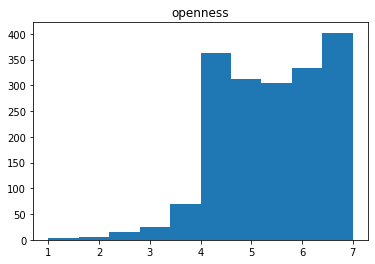

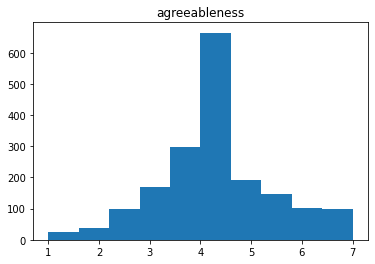

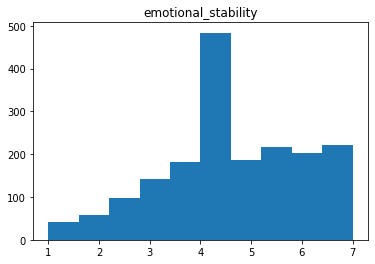

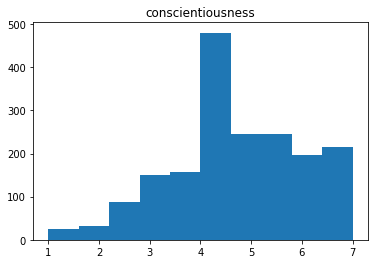

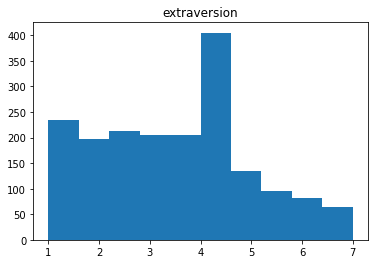

In [22]:
personality = ['openness', 'agreeableness', 'emotional_stability', 'conscientiousness', 'extraversion']

for i in personality:
    plt.hist(df[i])
    plt.title(i)
    plt.show()
    

<AxesSubplot:>

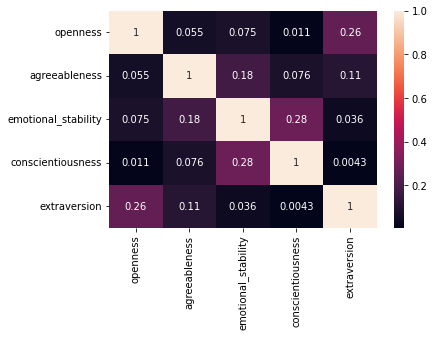

In [23]:
sns.heatmap(df[personality].corr(), annot = True)

C:\Users\asbar\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


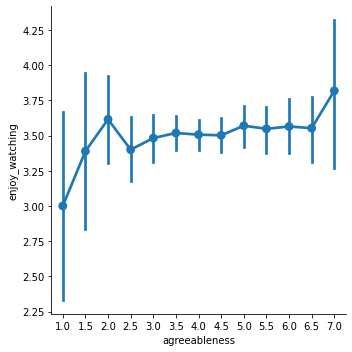

In [94]:
sns.factorplot( x = 'agreeableness', y = 'enjoy_watching', data = df)

In [27]:
df.columns

Index(['userid', 'openness', 'agreeableness', 'emotional_stability',
       'conscientiousness', 'extraversion', 'assigned metric',
       'assigned condition', ' movie_1', ' predicted_rating_1', ' movie_2',
       ' predicted_rating_2', ' movie_3', ' predicted_rating_3', ' movie_4',
       ' predicted_rating_4', ' movie_5', ' predicted_rating_5', ' movie_6',
       ' predicted_rating_6', ' movie_7', ' predicted_rating_7', ' movie_8',
       ' predicted_rating_8', ' movie_9', ' predicted_rating_9', ' movie_10',
       ' predicted_rating_10', ' movie_11', ' predicted_rating_11',
       ' movie_12', ' predicted_rating_12', 'is_personalized',
       'enjoy_watching'],
      dtype='object')

In [28]:
dataframe=(['userid', 'openness', 'agreeableness', 'emotional_stability',
       'conscientiousness', 'extraversion', 'assigned metric',
       'assigned condition'])

In [33]:
df.isnull().sum() ##null values 

userid                  0
openness                0
agreeableness           0
emotional_stability     0
conscientiousness       0
extraversion            0
assigned metric         0
assigned condition      0
 movie_1                0
 predicted_rating_1     0
 movie_2                0
 predicted_rating_2     0
 movie_3                0
 predicted_rating_3     0
 movie_4                0
 predicted_rating_4     0
 movie_5                0
 predicted_rating_5     0
 movie_6                0
 predicted_rating_6     0
 movie_7                0
 predicted_rating_7     0
 movie_8                0
 predicted_rating_8     0
 movie_9                0
 predicted_rating_9     0
 movie_10               0
 predicted_rating_10    0
 movie_11               0
 predicted_rating_11    0
 movie_12               0
 predicted_rating_12    0
is_personalized         0
enjoy_watching          0
dtype: int64

C:\Users\asbar\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


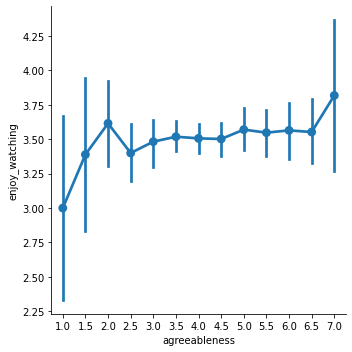

In [44]:
sns.factorplot( x = 'agreeableness', y = 'enjoy_watching', data = df)

<AxesSubplot:>

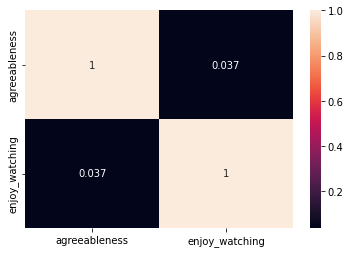

In [45]:
sns.heatmap(df[['agreeableness','enjoy_watching']].corr(), annot = True)

In [46]:
df

,userid,openness,agreeableness,emotional_stability,conscientiousness,extraversion,assigned metric,assigned condition,movie_1,predicted_rating_1,...,movie_9,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching
0,8e7cebf9a234c064b75016249f2ac65e,5.0,2.0,3.0,2.5,6.5,serendipity,high,77658,4.410466,...,120138,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4
1,77c7d756a093150d4377720abeaeef76,7.0,4.0,6.0,5.5,4.0,all,default,94959,4.207280,...,56782,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3
2,b7e8a92987a530cc368719a0e60e26a3,4.0,3.0,4.5,2.0,2.5,serendipity,medium,110501,4.868064,...,2288,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2
3,92561f21446e017dd6b68b94b23ad5b7,5.5,5.5,4.0,4.5,4.0,popularity,medium,2905,4.526371,...,3030,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3
4,030001ac2145a938b07e686a35a2d638,5.5,5.5,3.5,4.5,2.5,popularity,medium,2905,4.526371,...,3030,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1829,cff910b71f09b3120289ff6b461a9e03,5.5,3.5,2.5,4.0,5.5,popularity,low,108979,4.246346,...,6643,4.409108,115122,3.960470,7700,4.178546,67997,4.085300,3,3
1830,1ab3a4c2921d8da640854819b0f6cfce,4.0,3.5,4.5,4.0,2.5,serendipity,high,93040,4.227140,...,5618,4.149697,903,4.116152,38061,4.155210,1197,4.045751,3,4
1831,a06386edadf3bc614dadb7044708c46c,6.0,3.0,5.5,3.5,6.0,serendipity,low,106173,3.935297,...,26519,3.998642,89707,4.144870,2571,3.860041,108709,3.899857,3,4
1832,bad56d9506832cd79d874a6b66b3d813,5.0,3.5,1.5,3.5,2.5,serendipity,medium,6874,4.241766,...,92259,4.819710,32,4.059369,3730,4.427336,3435,4.844386,4,4


In [47]:
df['assigned metric'].unique()

array(['serendipity', ' all', 'popularity', 'diversity'], dtype=object)

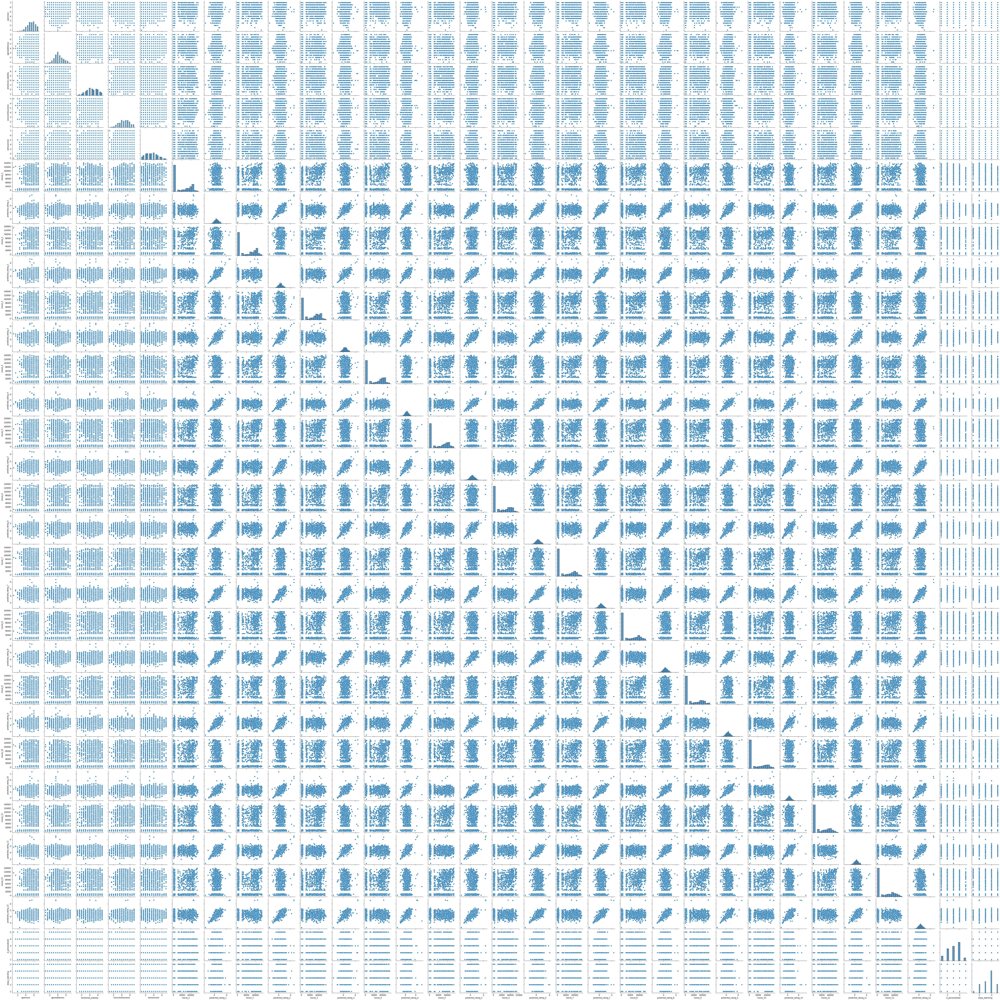

In [48]:
sns.pairplot(df) 

In [51]:
corrmat=df.corr() 

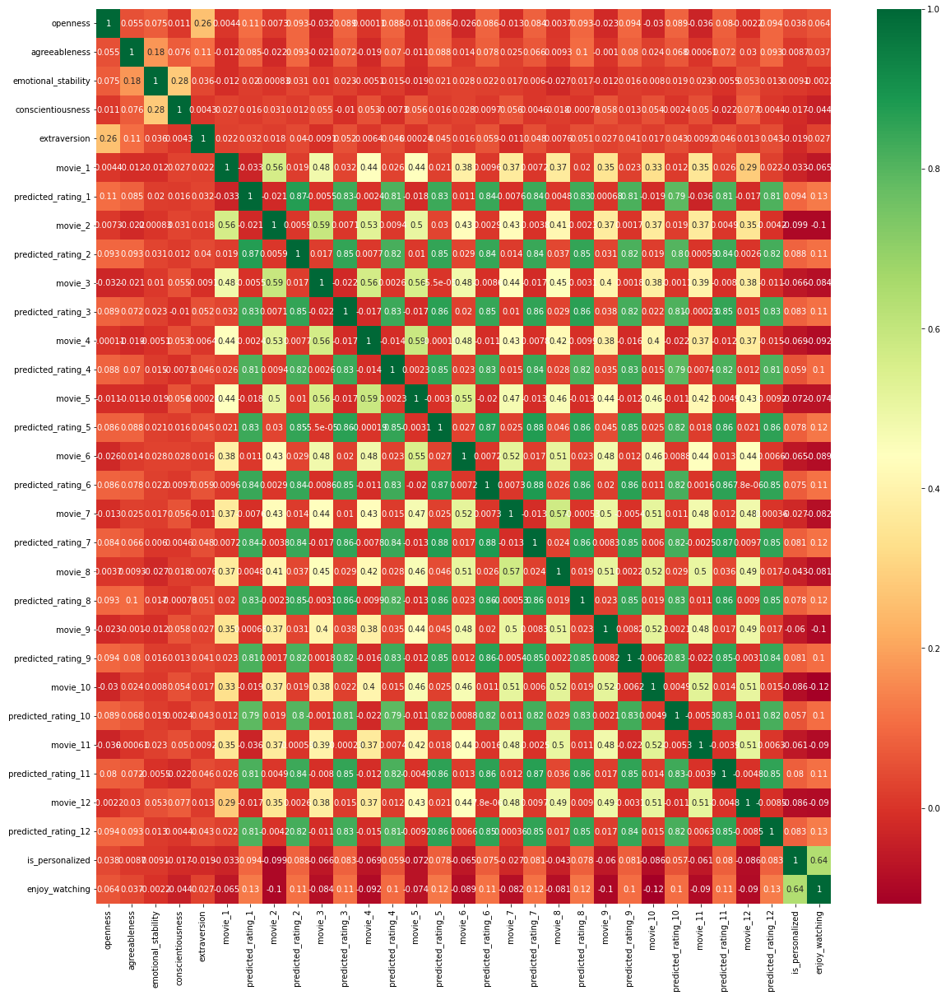

In [52]:
import seaborn as sns
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [58]:
personality = ['openness', 'agreeableness', 'emotional_stability', 'conscientiousness', 'extraversion']



IndentationError: unexpected indent (1708164267.py, line 3)

<AxesSubplot:>

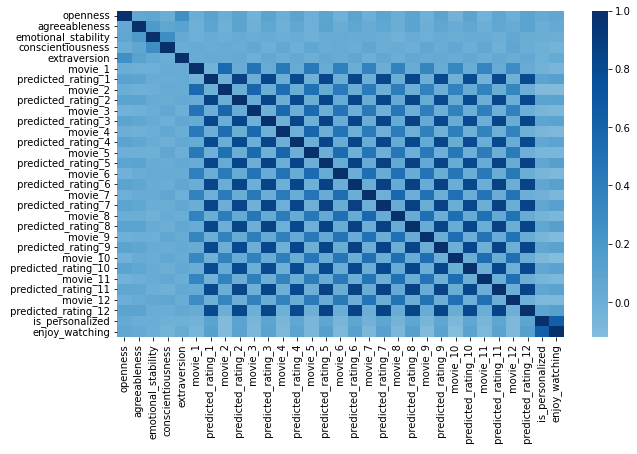

In [61]:
fig, pd = plt.subplots(figsize=(10,6))
sns.heatmap(df.corr(), center=0, cmap=('Blues'))

<AxesSubplot:>

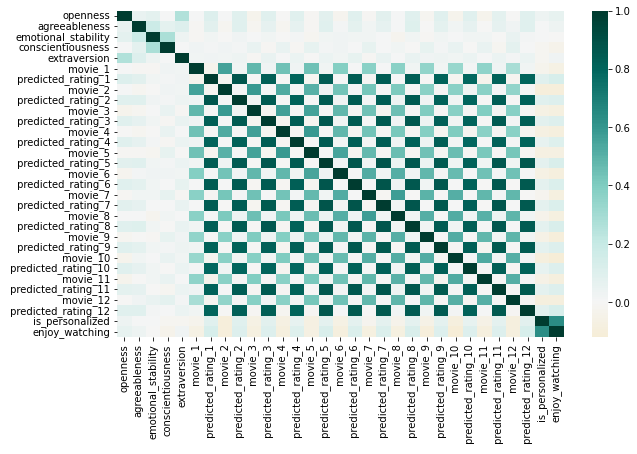

In [62]:
fig, pd = plt.subplots(figsize=(10,6))
sns.heatmap(df.corr(), center=0, cmap=('BrBG'))

In [ ]:
#FEATURE SELECTION

In [183]:
X=df.iloc[:,1:5]
y=df.iloc[:,28]
X_train,X_test,y_train,y_test

(      openness  agreeableness  emotional_stability  conscientiousness  \
 834        6.0            5.0                  5.5                5.0   
 1076       6.5            6.5                  6.0                7.0   
 1253       3.0            6.0                  5.5                5.0   
 878        7.0            4.0                  5.0                6.5   
 459        5.0            3.5                  6.0                2.5   
 ...        ...            ...                  ...                ...   
 827        4.0            6.5                  5.0                6.5   
 404        6.5            4.0                  4.0                5.0   
 1522       4.5            5.0                  3.5                6.5   
 952        6.5            6.5                  3.5                5.5   
 592        5.5            4.0                  5.5                5.5   
 
       extraversion   movie_1   predicted_rating_1   movie_2  \
 834            4.0      5319             5.15

In [184]:
X_train.shape

(1467, 32)

In [185]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2)

In [186]:
import pandas as pd 

In [187]:
X.head()

,agreeableness,emotional_stability,conscientiousness,extraversion,movie_1,predicted_rating_1,movie_2,predicted_rating_2,movie_3,predicted_rating_3,...,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching,row_num
0,2.0,3.0,2.5,6.5,77658,4.410466,95858,4.271995,115713,4.611922,...,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4,0
1,4.0,6.0,5.5,4.0,94959,4.207280,1247,4.266540,953,4.211322,...,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3,1
2,3.0,4.5,2.0,2.5,110501,4.868064,77658,4.710444,101895,5.029360,...,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2,2
3,5.5,4.0,4.5,4.0,2905,4.526371,2843,4.456451,3629,4.668444,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3,3
4,5.5,3.5,4.5,2.5,2905,4.526371,2843,4.456451,3629,4.668444,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3,4


In [189]:
pip install sklearn  


Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: threadpoolctl>=2.0.0 in c:\users\asbar\appdata\local\programs\python\python310\lib\site-packages (from scikit-learn->sklearn) (3.1.0)



You should consider upgrading via the 'C:\Users\asbar\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [ ]:
#APPLYING RANDOM FOREST

In [190]:
from sklearn.ensemble import RandomForestRegressor
rf_random=RandomForestRegressor()
##it can perform both regression and classification tasks because there are many parameters

In [191]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2)

In [192]:
import numpy as np

In [193]:
n_estimators=[int(X) for X in np.linspace(start=100,stop=1200,num=12)]
print(n_estimators)

[100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200]


In [194]:
from sklearn.model_selection import train_test_split



In [195]:
pip install -U scikit-learn


You should consider upgrading via the 'C:\Users\asbar\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [196]:
from sklearn.model_selection import RandomizedSearchCV

In [197]:
n_estimator=[int(x) for x in np.linspace (start=100,stop=1200,num=12)]

In [198]:
max_features=['auto','sqrt']

In [199]:
max_depth= [int(x) for x in np.linspace (5,30,num=6)]

In [200]:

min_samples_split = [2,5,10,15,100]
min_sample_leaf=[1,2,5,10]

In [201]:
## creating random grid

random_grid={'n_estimators': n_estimators,'max_features':max_features,'max_depth':max_depth,'min_samples_split':min_samples_split,'min_sample_leaf':min_sample_leaf}

In [202]:
print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_sample_leaf': [1, 2, 5, 10]}


In [203]:
rf=RandomForestRegressor()

In [204]:
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = 1)

In [205]:
 #Randomized Search CV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]

In [206]:
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [1, 2, 5, 10]}


In [207]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()

In [208]:
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 10, cv = 5, verbose=2, random_state=42,n_jobs=1)


In [209]:
df.head()

,openness,agreeableness,emotional_stability,conscientiousness,extraversion,movie_1,predicted_rating_1,movie_2,predicted_rating_2,movie_3,...,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching,row_num
0,5.0,2.0,3.0,2.5,6.5,77658,4.410466,95858,4.271995,115713,...,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4,0
1,7.0,4.0,6.0,5.5,4.0,94959,4.207280,1247,4.266540,953,...,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3,1
2,4.0,3.0,4.5,2.0,2.5,110501,4.868064,77658,4.710444,101895,...,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2,2
3,5.5,5.5,4.0,4.5,4.0,2905,4.526371,2843,4.456451,3629,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3,3
4,5.5,5.5,3.5,4.5,2.5,2905,4.526371,2843,4.456451,3629,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3,4


In [138]:
#### row number using arange() in numpy
 
import numpy as np
 
df['row_num'] = np.arange(len(df))
print (df)

                                userid  openness  agreeableness  \
0     8e7cebf9a234c064b75016249f2ac65e       5.0            2.0   
1     77c7d756a093150d4377720abeaeef76       7.0            4.0   
2     b7e8a92987a530cc368719a0e60e26a3       4.0            3.0   
3     92561f21446e017dd6b68b94b23ad5b7       5.5            5.5   
4     030001ac2145a938b07e686a35a2d638       5.5            5.5   
...                                ...       ...            ...   
1829  cff910b71f09b3120289ff6b461a9e03       5.5            3.5   
1830  1ab3a4c2921d8da640854819b0f6cfce       4.0            3.5   
1831  a06386edadf3bc614dadb7044708c46c       6.0            3.0   
1832  bad56d9506832cd79d874a6b66b3d813       5.0            3.5   
1833  721ea658e148fc0f76ddd6e2b0e02422       6.5            6.5   

      emotional_stability  conscientiousness  extraversion assigned metric  \
0                     3.0                2.5           6.5     serendipity   
1                     6.0              

In [139]:
df.head()

,userid,openness,agreeableness,emotional_stability,conscientiousness,extraversion,assigned metric,assigned condition,movie_1,predicted_rating_1,...,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching,row_num
0,8e7cebf9a234c064b75016249f2ac65e,5.0,2.0,3.0,2.5,6.5,serendipity,high,77658,4.410466,...,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4,0
1,77c7d756a093150d4377720abeaeef76,7.0,4.0,6.0,5.5,4.0,all,default,94959,4.207280,...,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3,1
2,b7e8a92987a530cc368719a0e60e26a3,4.0,3.0,4.5,2.0,2.5,serendipity,medium,110501,4.868064,...,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2,2
3,92561f21446e017dd6b68b94b23ad5b7,5.5,5.5,4.0,4.5,4.0,popularity,medium,2905,4.526371,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3,3
4,030001ac2145a938b07e686a35a2d638,5.5,5.5,3.5,4.5,2.5,popularity,medium,2905,4.526371,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3,4


In [140]:
df.drop(['assigned metric'],axis = 1)

,userid,openness,agreeableness,emotional_stability,conscientiousness,extraversion,assigned condition,movie_1,predicted_rating_1,movie_2,...,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching,row_num
0,8e7cebf9a234c064b75016249f2ac65e,5.0,2.0,3.0,2.5,6.5,high,77658,4.410466,95858,...,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4,0
1,77c7d756a093150d4377720abeaeef76,7.0,4.0,6.0,5.5,4.0,default,94959,4.207280,1247,...,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3,1
2,b7e8a92987a530cc368719a0e60e26a3,4.0,3.0,4.5,2.0,2.5,medium,110501,4.868064,77658,...,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2,2
3,92561f21446e017dd6b68b94b23ad5b7,5.5,5.5,4.0,4.5,4.0,medium,2905,4.526371,2843,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3,3
4,030001ac2145a938b07e686a35a2d638,5.5,5.5,3.5,4.5,2.5,medium,2905,4.526371,2843,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1829,cff910b71f09b3120289ff6b461a9e03,5.5,3.5,2.5,4.0,5.5,low,108979,4.246346,33779,...,4.409108,115122,3.960470,7700,4.178546,67997,4.085300,3,3,1829
1830,1ab3a4c2921d8da640854819b0f6cfce,4.0,3.5,4.5,4.0,2.5,high,93040,4.227140,1199,...,4.149697,903,4.116152,38061,4.155210,1197,4.045751,3,4,1830
1831,a06386edadf3bc614dadb7044708c46c,6.0,3.0,5.5,3.5,6.0,low,106173,3.935297,126397,...,3.998642,89707,4.144870,2571,3.860041,108709,3.899857,3,4,1831
1832,bad56d9506832cd79d874a6b66b3d813,5.0,3.5,1.5,3.5,2.5,medium,6874,4.241766,38061,...,4.819710,32,4.059369,3730,4.427336,3435,4.844386,4,4,1832


In [142]:
df.drop(['assigned metric'],axis = 1,inplace=True)

In [143]:
df.head()

,userid,openness,agreeableness,emotional_stability,conscientiousness,extraversion,assigned condition,movie_1,predicted_rating_1,movie_2,...,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching,row_num
0,8e7cebf9a234c064b75016249f2ac65e,5.0,2.0,3.0,2.5,6.5,high,77658,4.410466,95858,...,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4,0
1,77c7d756a093150d4377720abeaeef76,7.0,4.0,6.0,5.5,4.0,default,94959,4.207280,1247,...,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3,1
2,b7e8a92987a530cc368719a0e60e26a3,4.0,3.0,4.5,2.0,2.5,medium,110501,4.868064,77658,...,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2,2
3,92561f21446e017dd6b68b94b23ad5b7,5.5,5.5,4.0,4.5,4.0,medium,2905,4.526371,2843,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3,3
4,030001ac2145a938b07e686a35a2d638,5.5,5.5,3.5,4.5,2.5,medium,2905,4.526371,2843,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3,4


In [144]:
df.drop(['assigned condition'],axis = 1,inplace=True)

In [145]:
df.head()

,userid,openness,agreeableness,emotional_stability,conscientiousness,extraversion,movie_1,predicted_rating_1,movie_2,predicted_rating_2,...,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching,row_num
0,8e7cebf9a234c064b75016249f2ac65e,5.0,2.0,3.0,2.5,6.5,77658,4.410466,95858,4.271995,...,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4,0
1,77c7d756a093150d4377720abeaeef76,7.0,4.0,6.0,5.5,4.0,94959,4.207280,1247,4.266540,...,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3,1
2,b7e8a92987a530cc368719a0e60e26a3,4.0,3.0,4.5,2.0,2.5,110501,4.868064,77658,4.710444,...,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2,2
3,92561f21446e017dd6b68b94b23ad5b7,5.5,5.5,4.0,4.5,4.0,2905,4.526371,2843,4.456451,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3,3
4,030001ac2145a938b07e686a35a2d638,5.5,5.5,3.5,4.5,2.5,2905,4.526371,2843,4.456451,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3,4


In [147]:
df.head()

,userid,openness,agreeableness,emotional_stability,conscientiousness,extraversion,movie_1,predicted_rating_1,movie_2,predicted_rating_2,...,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching,row_num
0,8e7cebf9a234c064b75016249f2ac65e,5.0,2.0,3.0,2.5,6.5,77658,4.410466,95858,4.271995,...,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4,0
1,77c7d756a093150d4377720abeaeef76,7.0,4.0,6.0,5.5,4.0,94959,4.207280,1247,4.266540,...,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3,1
2,b7e8a92987a530cc368719a0e60e26a3,4.0,3.0,4.5,2.0,2.5,110501,4.868064,77658,4.710444,...,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2,2
3,92561f21446e017dd6b68b94b23ad5b7,5.5,5.5,4.0,4.5,4.0,2905,4.526371,2843,4.456451,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3,3
4,030001ac2145a938b07e686a35a2d638,5.5,5.5,3.5,4.5,2.5,2905,4.526371,2843,4.456451,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3,4


In [177]:
df.drop(['userid'],axis = 1,inplace=True)

In [181]:
df.head()

,openness,agreeableness,emotional_stability,conscientiousness,extraversion,movie_1,predicted_rating_1,movie_2,predicted_rating_2,movie_3,...,predicted_rating_9,movie_10,predicted_rating_10,movie_11,predicted_rating_11,movie_12,predicted_rating_12,is_personalized,enjoy_watching,row_num
0,5.0,2.0,3.0,2.5,6.5,77658,4.410466,95858,4.271995,115713,...,4.244817,121372,4.396004,127152,4.120456,95311,4.053847,4,4,0
1,7.0,4.0,6.0,5.5,4.0,94959,4.207280,1247,4.266540,953,...,4.019599,5618,3.963953,969,4.174188,1232,4.334877,2,3,1
2,4.0,3.0,4.5,2.0,2.5,110501,4.868064,77658,4.710444,101895,...,4.823212,3307,4.676756,1172,4.649281,1212,4.744990,2,2,2
3,5.5,5.5,4.0,4.5,4.0,2905,4.526371,2843,4.456451,3629,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,3,3,3
4,5.5,5.5,3.5,4.5,2.5,2905,4.526371,2843,4.456451,3629,...,4.425689,1281,4.479921,940,4.355061,905,4.317927,2,3,4


In [210]:
from sklearn.ensemble import ExtraTreesRegressor
model=ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor()

In [211]:
print(model.feature_importances_)

[0.04118442 0.05666102 0.03898454 0.09593511 0.02752304 0.02778315
 0.0309491  0.02846095 0.03332095 0.02493921 0.02966393 0.02368173
 0.02867728 0.02351233 0.02992436 0.02347274 0.02791815 0.02481343
 0.02987179 0.0270816  0.02981577 0.02301792 0.03083553 0.02501164
 0.03175707 0.02421143 0.02697896 0.02636512 0.03550007 0.03536381
 0.03678384]


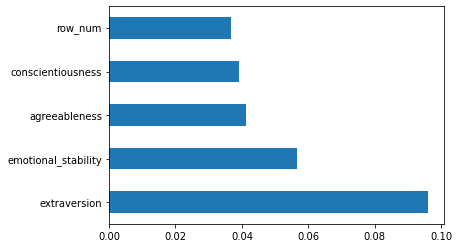

In [213]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

In [214]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()

In [215]:
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 10, cv = 5, verbose=2, random_state=42,n_jobs=1)

In [217]:
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = 1)

In [218]:
rf_random.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   2.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   1.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   1.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   1.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   1.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   2.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   2.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimator

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [220]:
rf_random.best_score_

-0.9994931070128927

In [221]:
predictions=rf_random.predict(X_test)

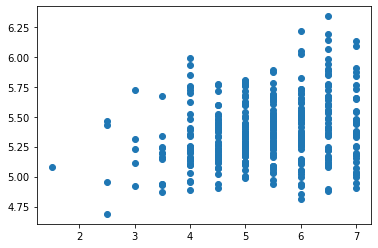

In [222]:
plt.scatter(y_test,predictions)

In [223]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 0.8502734502898386
MSE: 1.0863302518383533
RMSE: 1.0422716785168602


In [249]:
from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(n_estimators=20, random_state=0)
regressor.fit(X_train, y_train)
y_predictions = regressor.predict(X_test)



In [250]:
predictions = regressor.predict(X_test)

In [251]:
print(((predictions)))

[5.425 4.95  5.    5.525 5.475 5.825 4.925 4.95  4.75  5.575 5.375 5.225
 6.025 5.175 5.45  5.    5.6   5.125 5.125 5.85  5.225 5.35  4.95  5.25
 5.325 5.7   5.475 5.35  5.85  4.45  5.65  5.15  5.425 5.675 5.225 5.05
 4.6   5.25  4.95  5.625 5.95  5.55  4.65  5.825 5.025 5.15  5.375 5.35
 5.125 5.775 5.875 5.4   5.775 6.25  4.85  6.175 5.025 5.375 4.875 5.725
 5.55  5.675 5.1   4.75  4.675 5.525 5.225 5.175 5.725 6.    5.225 5.625
 5.225 5.125 5.75  5.15  4.925 5.175 6.    5.2   4.95  5.075 5.475 5.875
 6.1   4.975 4.95  5.2   5.8   5.375 5.125 5.775 4.9   5.025 4.975 5.175
 5.65  5.7   5.375 5.125 5.3   5.35  5.225 4.8   5.475 6.05  6.1   5.05
 5.45  5.    5.675 5.4   5.775 4.525 5.2   4.9   4.825 4.75  5.    5.25
 5.45  5.475 5.2   5.55  5.05  5.725 4.8   4.875 5.125 5.825 5.175 5.55
 5.775 5.325 5.05  5.625 5.15  5.225 5.65  5.625 5.85  5.65  5.65  5.35
 5.925 6.075 5.45  5.375 5.275 4.7   4.475 5.225 5.525 5.25  5.375 4.2
 5.725 5.975 5.    5.325 5.05  5.125 4.875 5.525 5.55  5.5  

In [255]:
# Calculate the absolute errors
errors = abs(y_predictions - y_test)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test)
# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.88 degrees.
Accuracy: 81.72 %.


In [257]:
pip install pydot


Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\asbar\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


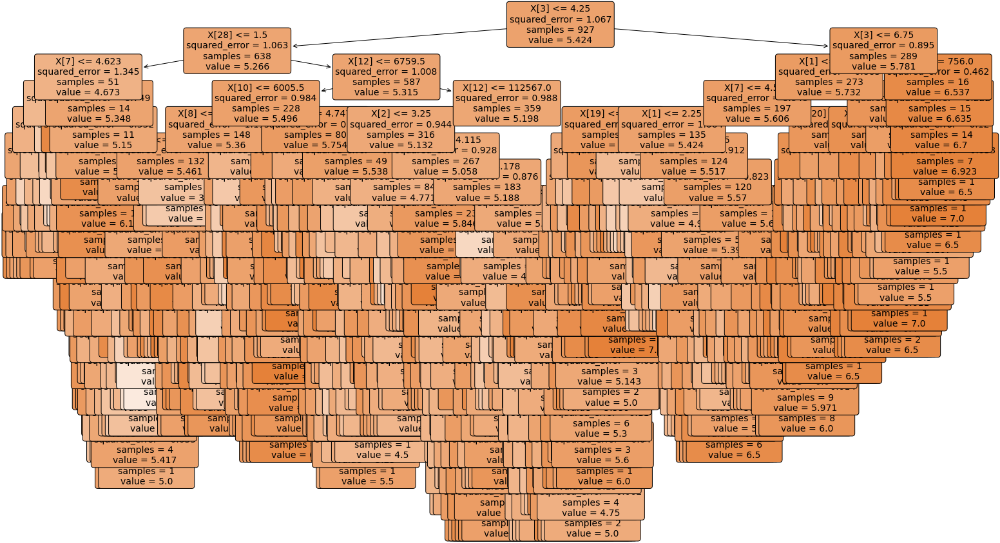

In [258]:
import pydot
# Pull out one tree from the forest
Tree = regressor.estimators_[5]
# Export the image to a dot file
from sklearn import tree
plt.figure(figsize=(25,15))
tree.plot_tree(Tree,filled=True, 
              rounded=True, 
              fontsize=14);